In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import re

In [6]:
dataset_path = r"Users\John\Desktop\MS ADS\ADSP 32014 IP01 Bayesian Machine Learning with Generative AI Applications\Project\archive\Dataset"

In [12]:
train_labels = pd.read_csv("../Dataset/Index/Train.csv")
print(train_labels.head())

   age  gender         filename  \
0    3       1  00013_00M19.JPG   
1    3       1  00013_01M19.JPG   
2    3       1  00013_02M19.JPG   
3    3       1  00022_03M19.JPG   
4    4       1  00022_04M20.JPG   

                                            filepath  
0  /kaggle/input/morph/Dataset/Images/Train/00013...  
1  /kaggle/input/morph/Dataset/Images/Train/00013...  
2  /kaggle/input/morph/Dataset/Images/Train/00013...  
3  /kaggle/input/morph/Dataset/Images/Train/00022...  
4  /kaggle/input/morph/Dataset/Images/Train/00022...  


In [13]:
def extract_person_id(filename):
    match = re.match(r"(\d+)_", filename)
    return match.group(1) if match else filename

train_labels["person_id"] = train_labels["filename"].apply(extract_person_id)

In [14]:
train_labels.head()

,age,gender,filename,filepath,person_id
0,3,1,00013_00M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00013...,00013
1,3,1,00013_01M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00013...,00013
2,3,1,00013_02M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00013...,00013
3,3,1,00022_03M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00022...,00022
4,4,1,00022_04M20.JPG,/kaggle/input/morph/Dataset/Images/Train/00022...,00022


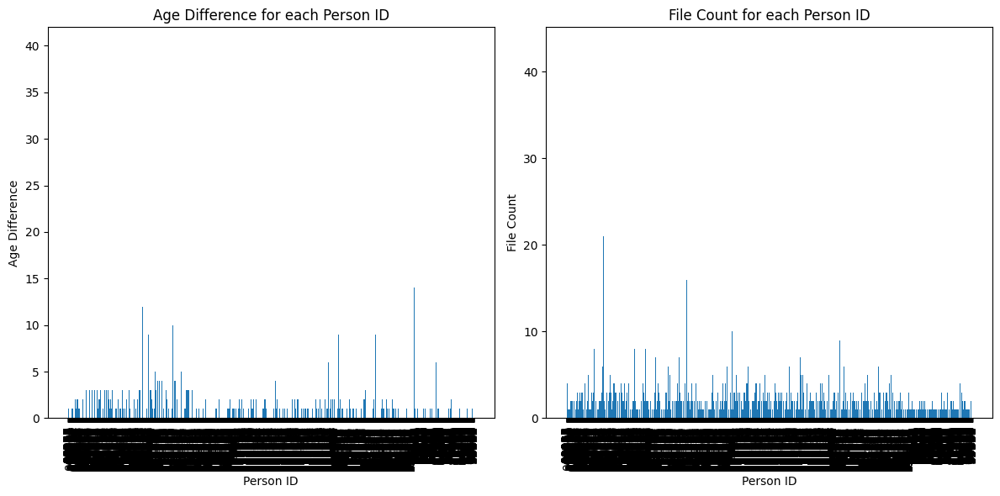

In [18]:
# Group by person_id and calculate the age difference and file count
grouped = train_labels.groupby('person_id').agg(
    age_diff=('age', lambda x: x.max() - x.min()),
    file_count=('filename', 'count')
).reset_index()

# Plot the age difference
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(grouped['person_id'], grouped['age_diff'])
plt.xlabel('Person ID')
plt.ylabel('Age Difference')
plt.title('Age Difference for each Person ID')
plt.xticks(rotation=90)

# Plot the file count
plt.subplot(1, 2, 2)
plt.bar(grouped['person_id'], grouped['file_count'])
plt.xlabel('Person ID')
plt.ylabel('File Count')
plt.title('File Count for each Person ID')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [19]:
# Filter the grouped dataframe to include only people with more than 1 photo
filtered_grouped = grouped[grouped['file_count'] > 1]

# Initialize a dictionary to store the results
age_diff_stats = {}

# Calculate the average age difference for each n in the range of 2 to 40
for n in range(2, 40):
    subset = filtered_grouped[filtered_grouped['file_count'] == n]
    if not subset.empty:
        avg_age_diff = subset['age_diff'].mean()
        age_diff_stats[n] = avg_age_diff

# Print the statistics
for n, avg_age_diff in age_diff_stats.items():
    print(f"Number of photos: {n}, Average age difference: {avg_age_diff:.2f}")

Number of photos: 2, Average age difference: 0.99
Number of photos: 3, Average age difference: 1.61
Number of photos: 4, Average age difference: 2.00
Number of photos: 5, Average age difference: 2.20
Number of photos: 6, Average age difference: 2.52
Number of photos: 7, Average age difference: 2.63
Number of photos: 8, Average age difference: 2.71
Number of photos: 9, Average age difference: 3.33
Number of photos: 10, Average age difference: 2.67
Number of photos: 11, Average age difference: 2.80
Number of photos: 12, Average age difference: 2.74
Number of photos: 13, Average age difference: 3.25
Number of photos: 14, Average age difference: 2.17
Number of photos: 15, Average age difference: 5.50
Number of photos: 16, Average age difference: 4.60
Number of photos: 17, Average age difference: 3.00
Number of photos: 18, Average age difference: 3.67
Number of photos: 19, Average age difference: 4.75
Number of photos: 20, Average age difference: 6.50
Number of photos: 21, Average age diffe

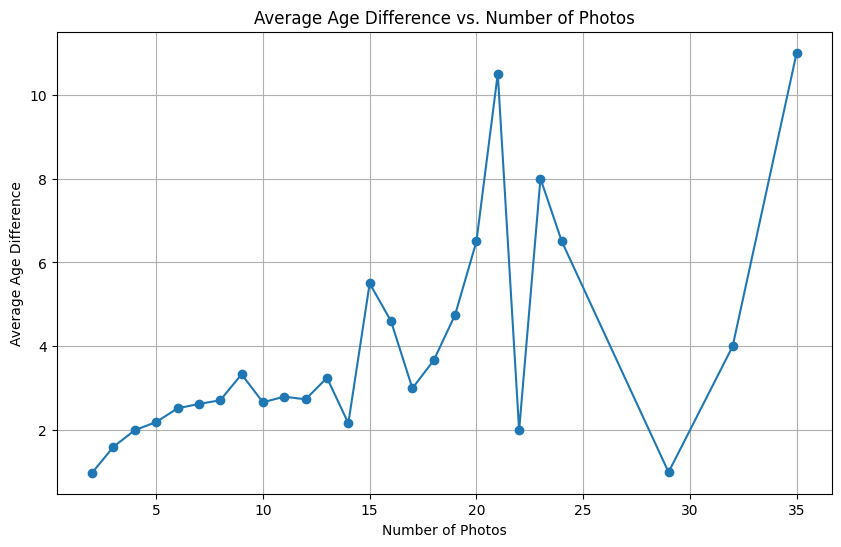

In [20]:
# Convert the age_diff_stats dictionary to a DataFrame
age_diff_df = pd.DataFrame(list(age_diff_stats.items()), columns=['Number of Photos', 'Average Age Difference'])

# Plot the DataFrame
plt.figure(figsize=(10, 6))
plt.plot(age_diff_df['Number of Photos'], age_diff_df['Average Age Difference'], marker='o')
plt.xlabel('Number of Photos')
plt.ylabel('Average Age Difference')
plt.title('Average Age Difference vs. Number of Photos')
plt.grid(True)
plt.show()

In [21]:
# Filter the DataFrame to include only people with at least 2 photos
at_least_2_photos = filtered_grouped[filtered_grouped['file_count'] >= 2]

# Calculate the average age difference
avg_age_diff_at_least_2_photos = at_least_2_photos['age_diff'].mean()

print(f"The average age difference for anyone with at least 2 photos is: {avg_age_diff_at_least_2_photos:.2f}")

The average age difference for anyone with at least 2 photos is: 1.46


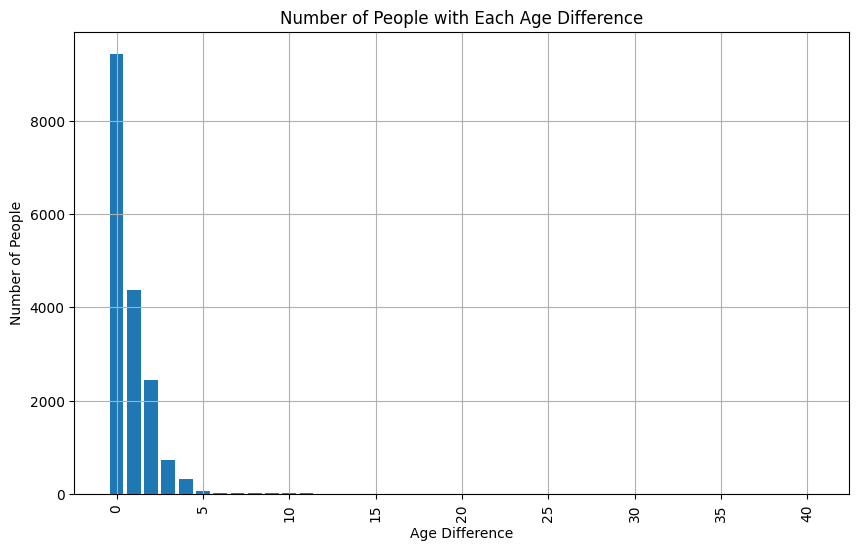

In [23]:
# Group by age_diff and count the number of people for each age difference
age_diff_counts = grouped['age_diff'].value_counts().sort_index()

# Plot the number of people with each age difference
plt.figure(figsize=(10, 6))
plt.bar(age_diff_counts.index, age_diff_counts.values)
plt.xlabel('Age Difference')
plt.ylabel('Number of People')
plt.title('Number of People with Each Age Difference')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

In [25]:
pip install deeplake

     ---------------------------------------- 0.0/627.3 kB ? eta -:--:--
     -------------------------------------- 627.3/627.3 kB 3.3 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached urllib3-2.3.0-py3-none-any.whl.metadata (6.5 kB)
   ---------------------------------------- 0.0/15.5 MB ? eta -:--:--
   ------ --------------------------------- 2.4/15.5 MB 11.2 MB/s eta 0:00:02
   ----------- ---------------------------- 4.5/15.5 MB 11.2 MB/s eta 0:00:01
   ---------------- ----------------------- 6.6/15.5 MB 10.9 MB/s eta 0:00:01
   -------------------

  You can safely remove it manually.
  You can safely remove it manually.

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
import deeplake
ds = deeplake.load('hub://activeloop/cacd')

c:\Users\John\AppData\Local\Programs\Python\Python312\Lib\site-packages\deeplake\util\check_latest_version.py:32: UserWarning: A newer version of deeplake (4.1.6) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(
\

Opening dataset in read-only mode as you don't have write permissions.


\

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/cacd



-

hub://activeloop/cacd loaded successfully.



\

In [31]:
local_path = 'path/to/save/dataset'
ds.copy(local_path)

path/to/save/dataset loaded successfully.


Evaluating copy transform: 100%|██████████| 163446/163446 [13:40<00:00


Dataset(path='path/to/save/dataset', tensors=['images', 'keypoints'])

In [32]:
print(ds)

Dataset(path='hub://activeloop/cacd', read_only=True, tensors=['images', 'keypoints'])


In [33]:
print(ds.tensors)

{'images': Tensor(key='images'), 'keypoints': Tensor(key='keypoints')}


In [34]:
print(ds[0])

Dataset(path='hub://activeloop/cacd', read_only=True, index=Index([0]), tensors=['images', 'keypoints'])


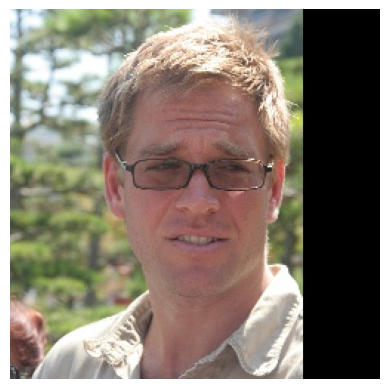

In [36]:
image = ds.images[0].numpy()

plt.imshow(image)
plt.axis('off')
plt.show()

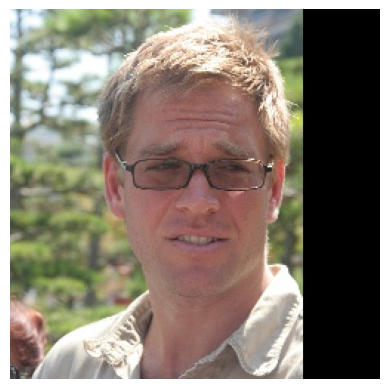

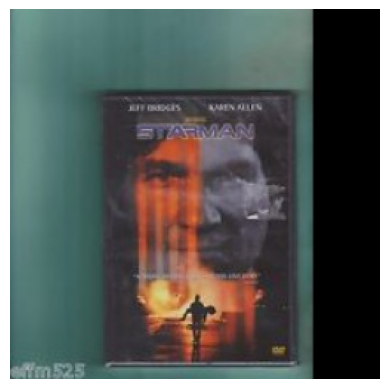

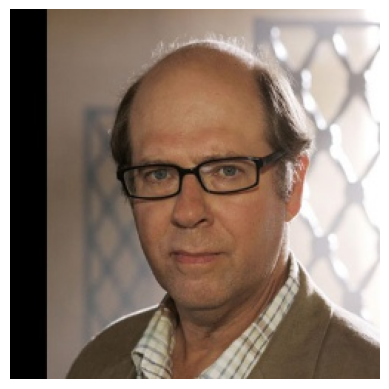

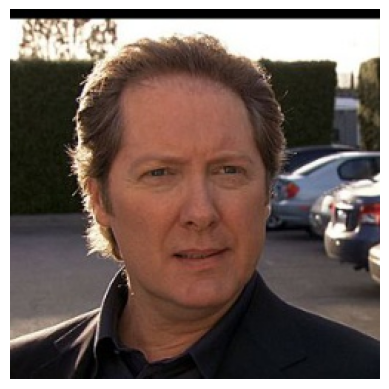

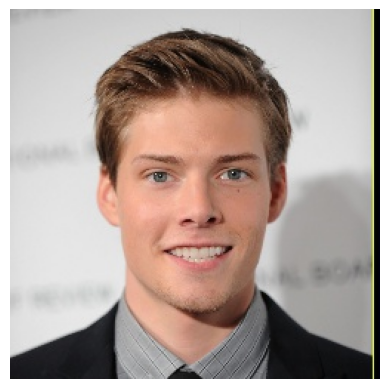

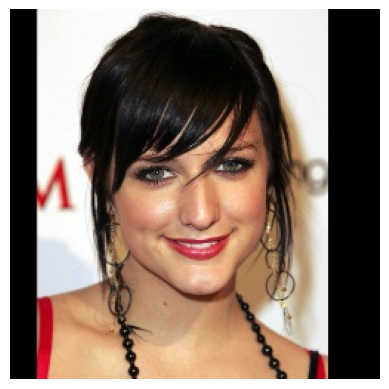

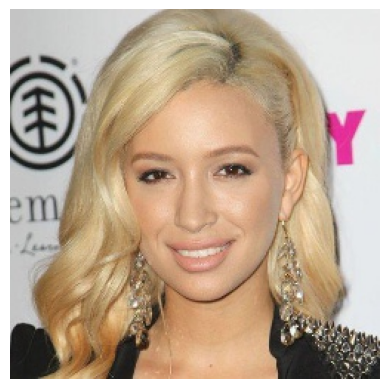

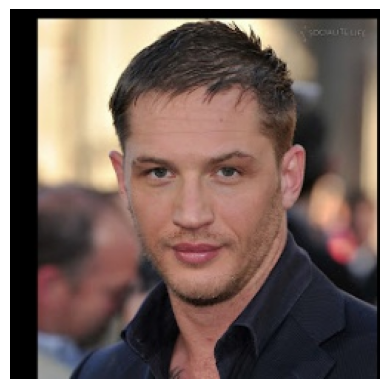

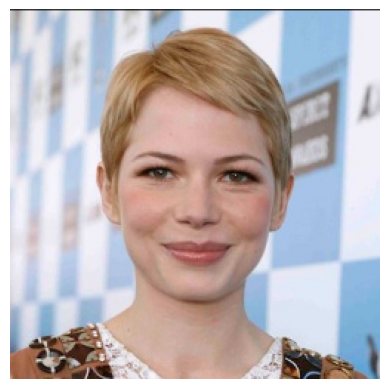

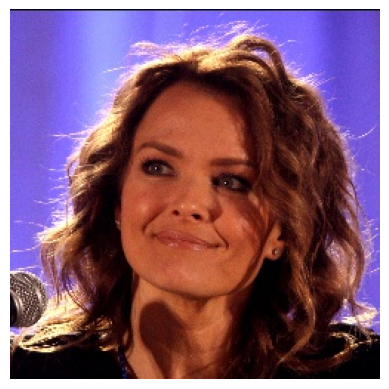

c:\Users\John\AppData\Local\Programs\Python\Python312\Lib\site-packages\deeplake\core\tensor.py:719: UserWarning: Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds.tensor[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead.
  warnings.warn(


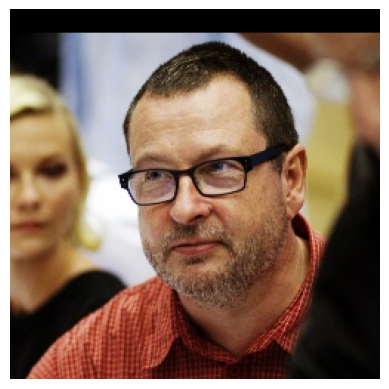

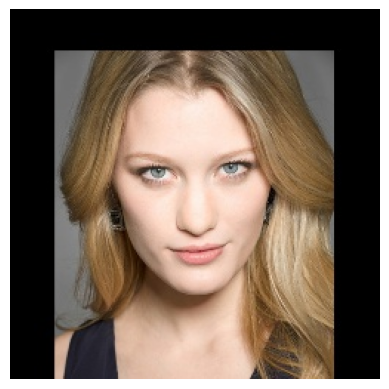

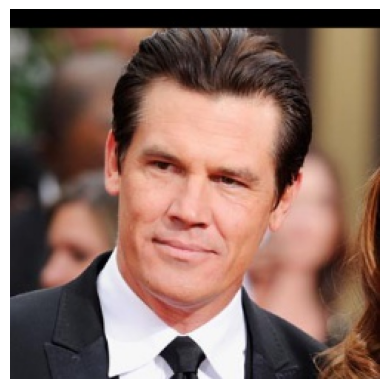

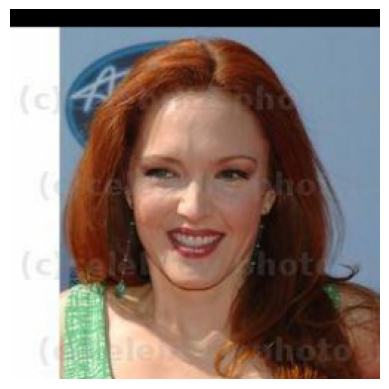

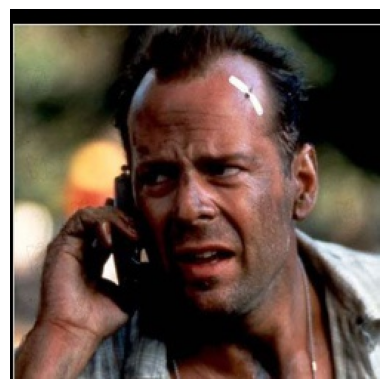

...

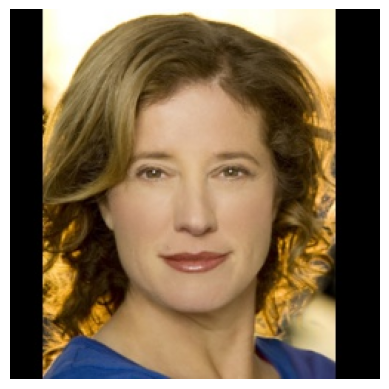

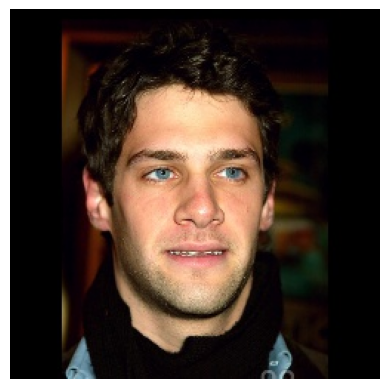

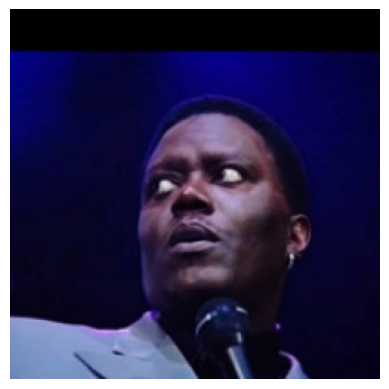

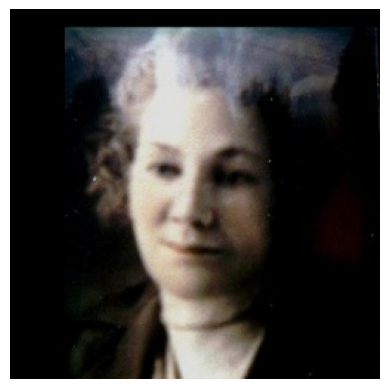

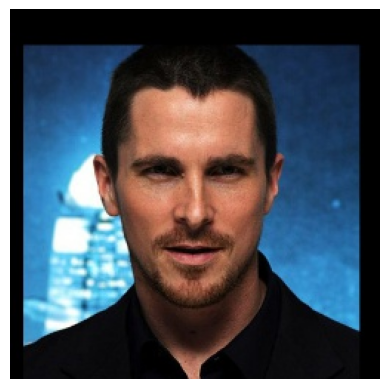

In [37]:
for n in range(0, 50):
    image = ds.images[n].numpy()
    plt.imshow(image)
    plt.axis('off')
    plt.show()